# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:03, 49.4MB/s]                            
SVHN Testing Set: 64.3MB [00:01, 41.0MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

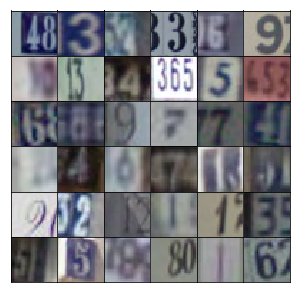

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [49]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        
        # FC step: FC + BN + LRELU
        x = tf.layers.dense(inputs=z, units=4*4*512, activation=None)
        x_reshape = tf.reshape(x, (-1,4,4,512))
        bn_fc = tf.layers.batch_normalization(x_reshape, training=training, name='bn_fc')
        lrelu_fc = tf.maximum(alpha*bn_fc, bn_fc, name='lrelu_fc')
        
        # CONV TRANS + BN + LRELU
        conv1 = tf.layers.conv2d_transpose(lrelu_fc, filters=256, kernel_size=(5,5), strides=(2,2), padding='same', name='conv1')
        bn_conv1 = tf.layers.batch_normalization(conv1, training=training, name='bn_conv1')
        lrelu_conv1 = tf.maximum(alpha*bn_conv1, bn_conv1, name='lrelu_conv1')
        
        # CONV TRANS + BN + LRELU
        conv2 = tf.layers.conv2d_transpose(lrelu_conv1, filters=128, kernel_size=(5,5), strides=(2,2), padding='same', name='conv2')
        bn_conv2 = tf.layers.batch_normalization(conv2, training=training, name='bn_conv2')
        lrelu_conv2 = tf.maximum(alpha*bn_conv2, bn_conv2, name='lrelu_conv2')
        
        # OUTPUT LAYER: CONV TRANSPOSE
        logits = tf.layers.conv2d_transpose(lrelu_conv2, filters=output_dim, kernel_size=(5,5), strides=(2,2), padding='same', name='logits')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [80]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):

        # CONV + LRELU
        # Input layer is 32x32x3
        conv1 = tf.layers.conv2d(inputs=x, filters=64, kernel_size=(5,5), strides=(2,2), padding='same', name='conv1')
        lrelu_conv1 = tf.maximum(alpha*conv1, conv1, name='lrelu_conv1')
        
        # CONV + BN + LRELU
        # Input shape 16x16x32
        conv2 = tf.layers.conv2d(inputs=lrelu_conv1, filters=128, kernel_size=(5,5), strides=(2,2), padding='same', name='conv2')
        bn_conv2 = tf.layers.batch_normalization(conv2, training=True, name='bn_conv2')
        lrelu_conv2 = tf.maximum(alpha*bn_conv2, bn_conv2, name='lrelu_conv2')
        
        # CONV + BN + LRELU
        # Input shape 8x8x64
        conv3 = tf.layers.conv2d(inputs=lrelu_conv2, filters=256, kernel_size=(5,5), strides=(2,2), padding='same', name='conv3')
        bn_conv3 = tf.layers.batch_normalization(conv3, training=True, name='bn_conv3')
        lrelu_conv3 = tf.maximum(alpha*bn_conv3, bn_conv3, name='lrelu_conv3')
        
        # FC + Sigmoid
        # Input shape 4*4*128
        flatten = tf.reshape(lrelu_conv3, (-1,4*4*256))
        logits = tf.layers.dense(flatten, 1, name='logits')
        out = tf.nn.sigmoid(logits, name='output_sigmoid')
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [81]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [82]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [83]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [84]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [85]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 64
epochs = 10
alpha = 0.15
beta1 = 0.9

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 0.1058... Generator Loss: 13.5245
Epoch 1/10... Discriminator Loss: 0.3144... Generator Loss: 2.2582
Epoch 1/10... Discriminator Loss: 0.0344... Generator Loss: 7.1484
Epoch 1/10... Discriminator Loss: 0.0597... Generator Loss: 3.5905
Epoch 1/10... Discriminator Loss: 0.0496... Generator Loss: 5.8627
Epoch 1/10... Discriminator Loss: 0.0131... Generator Loss: 5.4230
Epoch 1/10... Discriminator Loss: 0.0051... Generator Loss: 6.5796
Epoch 1/10... Discriminator Loss: 0.0060... Generator Loss: 5.9147
Epoch 1/10... Discriminator Loss: 0.0039... Generator Loss: 6.5873
Epoch 1/10... Discriminator Loss: 0.0126... Generator Loss: 6.5711


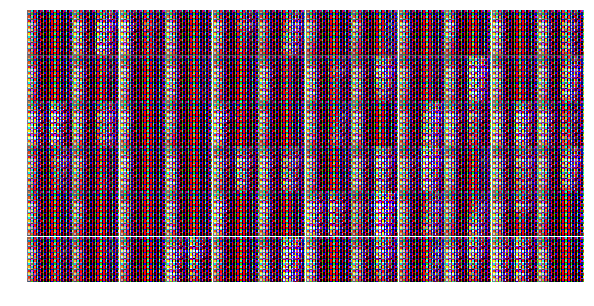

Epoch 1/10... Discriminator Loss: 0.0133... Generator Loss: 5.1825
Epoch 1/10... Discriminator Loss: 0.0010... Generator Loss: 12.4155
Epoch 1/10... Discriminator Loss: 0.0020... Generator Loss: 7.6677
Epoch 1/10... Discriminator Loss: 0.0020... Generator Loss: 7.8865
Epoch 1/10... Discriminator Loss: 0.0005... Generator Loss: 8.3311
Epoch 1/10... Discriminator Loss: 0.0072... Generator Loss: 5.4019
Epoch 1/10... Discriminator Loss: 0.0137... Generator Loss: 4.6077
Epoch 1/10... Discriminator Loss: 0.0841... Generator Loss: 3.7794
Epoch 1/10... Discriminator Loss: 0.0060... Generator Loss: 7.8878
Epoch 1/10... Discriminator Loss: 0.0071... Generator Loss: 8.9664


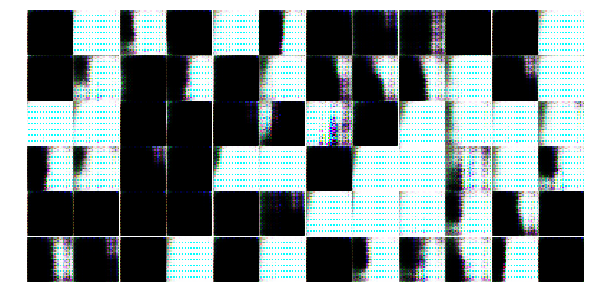

Epoch 1/10... Discriminator Loss: 0.0641... Generator Loss: 8.4051
Epoch 1/10... Discriminator Loss: 0.9118... Generator Loss: 4.3852
Epoch 1/10... Discriminator Loss: 0.1674... Generator Loss: 4.4342
Epoch 1/10... Discriminator Loss: 0.0112... Generator Loss: 5.6966
Epoch 1/10... Discriminator Loss: 0.1859... Generator Loss: 4.6278
Epoch 1/10... Discriminator Loss: 0.0538... Generator Loss: 5.3286
Epoch 1/10... Discriminator Loss: 0.0767... Generator Loss: 4.1393
Epoch 1/10... Discriminator Loss: 0.0198... Generator Loss: 6.1201
Epoch 1/10... Discriminator Loss: 0.0357... Generator Loss: 4.3501
Epoch 1/10... Discriminator Loss: 0.0604... Generator Loss: 4.4154


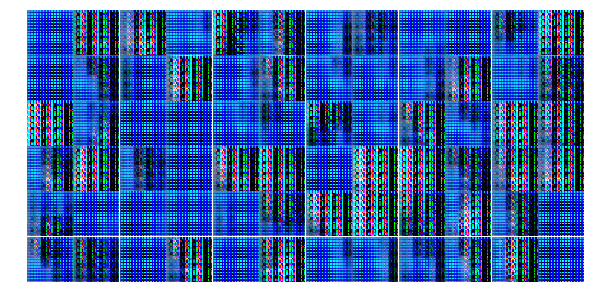

Epoch 1/10... Discriminator Loss: 0.0140... Generator Loss: 5.8205
Epoch 1/10... Discriminator Loss: 0.0788... Generator Loss: 7.8331
Epoch 1/10... Discriminator Loss: 0.0230... Generator Loss: 10.7576
Epoch 1/10... Discriminator Loss: 0.0379... Generator Loss: 4.2071
Epoch 1/10... Discriminator Loss: 0.0594... Generator Loss: 4.8243
Epoch 1/10... Discriminator Loss: 0.0686... Generator Loss: 3.5459
Epoch 1/10... Discriminator Loss: 0.1815... Generator Loss: 6.8986
Epoch 1/10... Discriminator Loss: 0.3195... Generator Loss: 4.5545
Epoch 1/10... Discriminator Loss: 0.0679... Generator Loss: 6.1722
Epoch 1/10... Discriminator Loss: 0.0694... Generator Loss: 5.0083


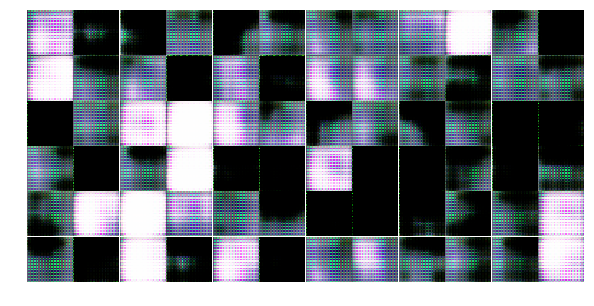

Epoch 1/10... Discriminator Loss: 0.0696... Generator Loss: 3.4081
Epoch 1/10... Discriminator Loss: 0.0999... Generator Loss: 3.2760
Epoch 1/10... Discriminator Loss: 0.2720... Generator Loss: 19.4728
Epoch 1/10... Discriminator Loss: 0.0934... Generator Loss: 4.1233
Epoch 1/10... Discriminator Loss: 0.0525... Generator Loss: 4.2300
Epoch 1/10... Discriminator Loss: 0.0546... Generator Loss: 5.6133
Epoch 1/10... Discriminator Loss: 0.0202... Generator Loss: 5.2576
Epoch 1/10... Discriminator Loss: 0.0174... Generator Loss: 7.6215
Epoch 1/10... Discriminator Loss: 0.0420... Generator Loss: 8.4338
Epoch 1/10... Discriminator Loss: 0.0061... Generator Loss: 5.9760


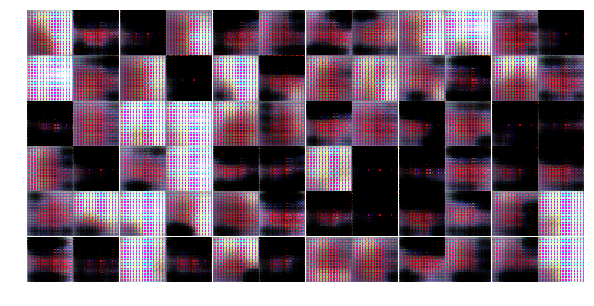

Epoch 1/10... Discriminator Loss: 0.0067... Generator Loss: 8.1464
Epoch 1/10... Discriminator Loss: 0.0510... Generator Loss: 3.7191
Epoch 1/10... Discriminator Loss: 0.0421... Generator Loss: 5.6049
Epoch 1/10... Discriminator Loss: 0.2949... Generator Loss: 3.6012
Epoch 1/10... Discriminator Loss: 0.3035... Generator Loss: 3.3247
Epoch 1/10... Discriminator Loss: 0.0284... Generator Loss: 10.7315
Epoch 1/10... Discriminator Loss: 0.3313... Generator Loss: 9.0076
Epoch 1/10... Discriminator Loss: 0.0762... Generator Loss: 4.7350
Epoch 1/10... Discriminator Loss: 0.5068... Generator Loss: 1.4779
Epoch 1/10... Discriminator Loss: 0.0065... Generator Loss: 8.2006


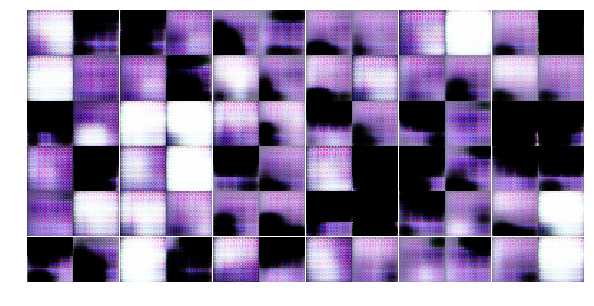

Epoch 1/10... Discriminator Loss: 0.1051... Generator Loss: 4.3912
Epoch 1/10... Discriminator Loss: 0.1824... Generator Loss: 6.5835
Epoch 1/10... Discriminator Loss: 0.4931... Generator Loss: 2.6400
Epoch 1/10... Discriminator Loss: 0.0537... Generator Loss: 4.0480
Epoch 1/10... Discriminator Loss: 0.0488... Generator Loss: 4.9668
Epoch 1/10... Discriminator Loss: 0.3796... Generator Loss: 4.4707
Epoch 1/10... Discriminator Loss: 0.0606... Generator Loss: 4.1396
Epoch 1/10... Discriminator Loss: 0.1275... Generator Loss: 3.4261
Epoch 1/10... Discriminator Loss: 0.2530... Generator Loss: 4.4311
Epoch 1/10... Discriminator Loss: 0.0628... Generator Loss: 6.4775


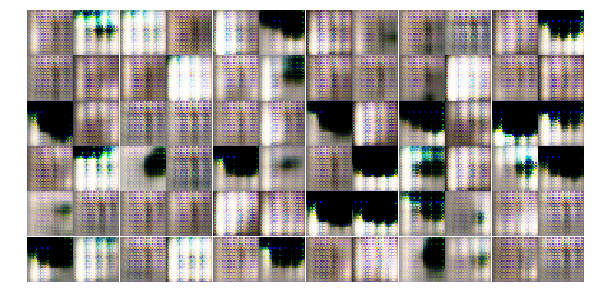

Epoch 1/10... Discriminator Loss: 0.0664... Generator Loss: 3.5669
Epoch 1/10... Discriminator Loss: 0.0519... Generator Loss: 4.2893
Epoch 1/10... Discriminator Loss: 2.7155... Generator Loss: 10.3719
Epoch 1/10... Discriminator Loss: 0.0163... Generator Loss: 6.9299
Epoch 1/10... Discriminator Loss: 0.4898... Generator Loss: 4.4507
Epoch 1/10... Discriminator Loss: 0.0699... Generator Loss: 3.5285
Epoch 1/10... Discriminator Loss: 0.1235... Generator Loss: 5.4843
Epoch 1/10... Discriminator Loss: 0.3928... Generator Loss: 1.5489
Epoch 1/10... Discriminator Loss: 0.1277... Generator Loss: 3.6791
Epoch 1/10... Discriminator Loss: 0.0532... Generator Loss: 3.9031


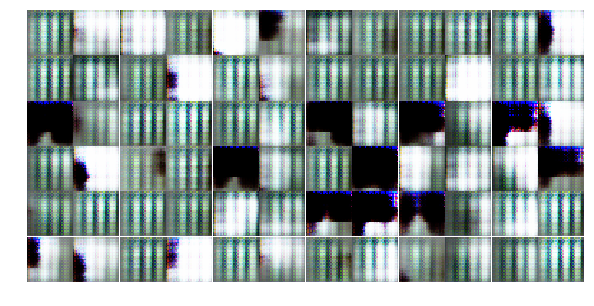

Epoch 1/10... Discriminator Loss: 0.1234... Generator Loss: 2.8862
Epoch 1/10... Discriminator Loss: 0.0219... Generator Loss: 7.5806
Epoch 1/10... Discriminator Loss: 0.3160... Generator Loss: 4.4416
Epoch 1/10... Discriminator Loss: 0.0650... Generator Loss: 4.5384
Epoch 1/10... Discriminator Loss: 0.0145... Generator Loss: 6.5583
Epoch 1/10... Discriminator Loss: 0.6233... Generator Loss: 8.1323
Epoch 1/10... Discriminator Loss: 0.0439... Generator Loss: 6.1602
Epoch 1/10... Discriminator Loss: 0.0922... Generator Loss: 3.2399
Epoch 1/10... Discriminator Loss: 0.6808... Generator Loss: 9.5296
Epoch 1/10... Discriminator Loss: 0.0524... Generator Loss: 4.5723


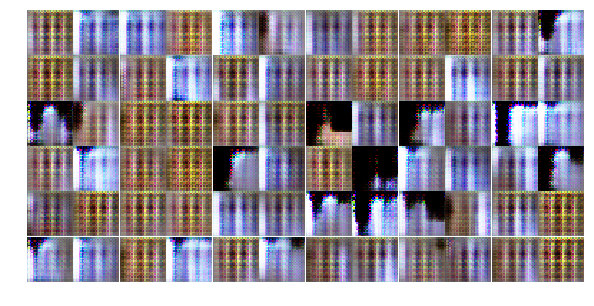

Epoch 1/10... Discriminator Loss: 0.5586... Generator Loss: 1.7309
Epoch 1/10... Discriminator Loss: 0.3264... Generator Loss: 7.7792
Epoch 1/10... Discriminator Loss: 0.0758... Generator Loss: 5.7322
Epoch 1/10... Discriminator Loss: 0.1626... Generator Loss: 3.2537
Epoch 1/10... Discriminator Loss: 0.3802... Generator Loss: 2.2265
Epoch 1/10... Discriminator Loss: 0.0279... Generator Loss: 5.9830
Epoch 1/10... Discriminator Loss: 0.2470... Generator Loss: 2.2640
Epoch 1/10... Discriminator Loss: 0.0709... Generator Loss: 5.4934
Epoch 1/10... Discriminator Loss: 0.0891... Generator Loss: 2.8439
Epoch 1/10... Discriminator Loss: 0.4417... Generator Loss: 1.2678


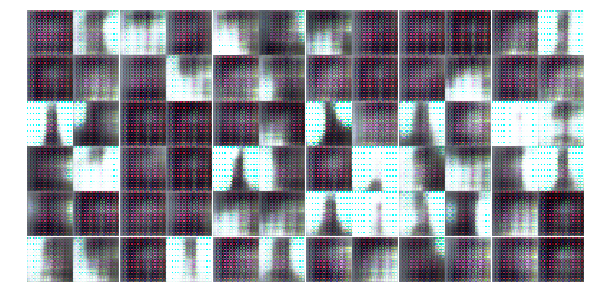

Epoch 1/10... Discriminator Loss: 1.4553... Generator Loss: 0.6275
Epoch 1/10... Discriminator Loss: 0.1828... Generator Loss: 3.3973
Epoch 1/10... Discriminator Loss: 0.0391... Generator Loss: 6.0870
Epoch 1/10... Discriminator Loss: 0.3483... Generator Loss: 3.0070
Epoch 1/10... Discriminator Loss: 0.1776... Generator Loss: 3.5703
Epoch 1/10... Discriminator Loss: 0.3049... Generator Loss: 2.2484
Epoch 1/10... Discriminator Loss: 0.5691... Generator Loss: 2.5665
Epoch 1/10... Discriminator Loss: 0.1276... Generator Loss: 3.0678
Epoch 1/10... Discriminator Loss: 0.0876... Generator Loss: 3.0581
Epoch 1/10... Discriminator Loss: 0.5340... Generator Loss: 5.3153


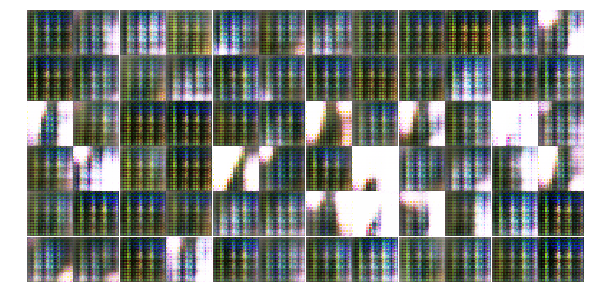

Epoch 1/10... Discriminator Loss: 0.2096... Generator Loss: 4.9408
Epoch 1/10... Discriminator Loss: 0.4704... Generator Loss: 4.3519
Epoch 1/10... Discriminator Loss: 0.1458... Generator Loss: 2.5697
Epoch 1/10... Discriminator Loss: 0.0755... Generator Loss: 3.2000
Epoch 2/10... Discriminator Loss: 0.0178... Generator Loss: 6.6876
Epoch 2/10... Discriminator Loss: 0.9228... Generator Loss: 3.9386
Epoch 2/10... Discriminator Loss: 0.2791... Generator Loss: 2.4613
Epoch 2/10... Discriminator Loss: 0.4741... Generator Loss: 2.5050
Epoch 2/10... Discriminator Loss: 0.0796... Generator Loss: 5.3013
Epoch 2/10... Discriminator Loss: 0.2194... Generator Loss: 2.3125


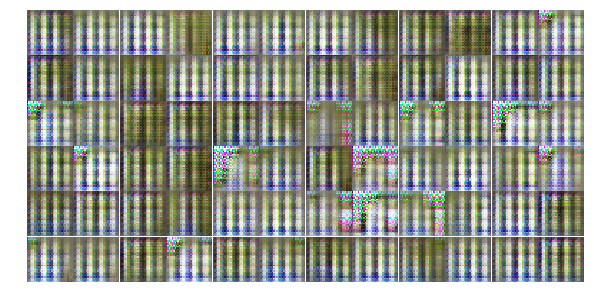

Epoch 2/10... Discriminator Loss: 0.7832... Generator Loss: 1.0478
Epoch 2/10... Discriminator Loss: 0.0324... Generator Loss: 6.7984
Epoch 2/10... Discriminator Loss: 0.5298... Generator Loss: 1.7578
Epoch 2/10... Discriminator Loss: 0.0374... Generator Loss: 6.5434
Epoch 2/10... Discriminator Loss: 1.1760... Generator Loss: 0.7016
Epoch 2/10... Discriminator Loss: 0.0965... Generator Loss: 4.3801
Epoch 2/10... Discriminator Loss: 0.3628... Generator Loss: 2.6998
Epoch 2/10... Discriminator Loss: 0.3166... Generator Loss: 2.3611
Epoch 2/10... Discriminator Loss: 0.2857... Generator Loss: 2.8643
Epoch 2/10... Discriminator Loss: 0.1129... Generator Loss: 4.0948


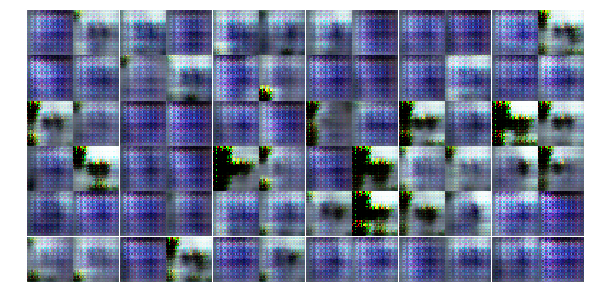

Epoch 2/10... Discriminator Loss: 0.3343... Generator Loss: 4.0980
Epoch 2/10... Discriminator Loss: 0.0632... Generator Loss: 4.2507
Epoch 2/10... Discriminator Loss: 0.1914... Generator Loss: 5.5815
Epoch 2/10... Discriminator Loss: 0.1671... Generator Loss: 4.0850
Epoch 2/10... Discriminator Loss: 0.3821... Generator Loss: 2.7004
Epoch 2/10... Discriminator Loss: 0.3007... Generator Loss: 8.6686
Epoch 2/10... Discriminator Loss: 0.1504... Generator Loss: 3.5356
Epoch 2/10... Discriminator Loss: 0.6920... Generator Loss: 3.3288
Epoch 2/10... Discriminator Loss: 0.0481... Generator Loss: 4.5226
Epoch 2/10... Discriminator Loss: 0.1978... Generator Loss: 4.6250


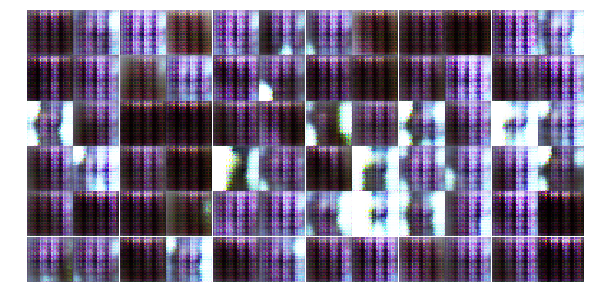

Epoch 2/10... Discriminator Loss: 0.1788... Generator Loss: 4.2017
Epoch 2/10... Discriminator Loss: 0.0257... Generator Loss: 4.7886
Epoch 2/10... Discriminator Loss: 0.2137... Generator Loss: 2.4605
Epoch 2/10... Discriminator Loss: 0.0388... Generator Loss: 5.3145
Epoch 2/10... Discriminator Loss: 0.3029... Generator Loss: 1.8865
Epoch 2/10... Discriminator Loss: 0.1981... Generator Loss: 2.7034
Epoch 2/10... Discriminator Loss: 0.1101... Generator Loss: 3.6568
Epoch 2/10... Discriminator Loss: 0.1474... Generator Loss: 4.4317
Epoch 2/10... Discriminator Loss: 0.5434... Generator Loss: 2.0617
Epoch 2/10... Discriminator Loss: 0.0699... Generator Loss: 3.6778


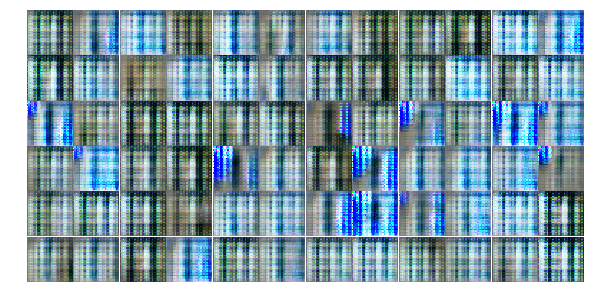

Epoch 2/10... Discriminator Loss: 0.0254... Generator Loss: 5.0338
Epoch 2/10... Discriminator Loss: 0.1831... Generator Loss: 2.7259
Epoch 2/10... Discriminator Loss: 0.9998... Generator Loss: 1.8401
Epoch 2/10... Discriminator Loss: 0.2909... Generator Loss: 4.4832
Epoch 2/10... Discriminator Loss: 0.2886... Generator Loss: 1.8735
Epoch 2/10... Discriminator Loss: 0.0787... Generator Loss: 4.2070
Epoch 2/10... Discriminator Loss: 0.2647... Generator Loss: 3.5858
Epoch 2/10... Discriminator Loss: 0.1326... Generator Loss: 4.0883
Epoch 2/10... Discriminator Loss: 0.1140... Generator Loss: 3.4536
Epoch 2/10... Discriminator Loss: 0.0790... Generator Loss: 4.0783


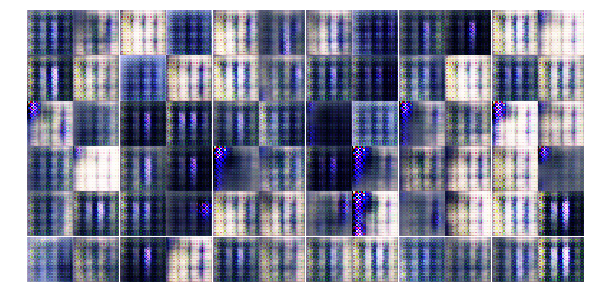

Epoch 2/10... Discriminator Loss: 0.4582... Generator Loss: 3.1027
Epoch 2/10... Discriminator Loss: 0.3665... Generator Loss: 4.8305
Epoch 2/10... Discriminator Loss: 0.2680... Generator Loss: 4.5381
Epoch 2/10... Discriminator Loss: 0.4623... Generator Loss: 8.0836
Epoch 2/10... Discriminator Loss: 0.1268... Generator Loss: 2.7190
Epoch 2/10... Discriminator Loss: 0.0176... Generator Loss: 7.4030
Epoch 2/10... Discriminator Loss: 0.2182... Generator Loss: 2.7006
Epoch 2/10... Discriminator Loss: 0.6710... Generator Loss: 1.3737
Epoch 2/10... Discriminator Loss: 0.0084... Generator Loss: 7.3606
Epoch 2/10... Discriminator Loss: 0.1358... Generator Loss: 3.6171


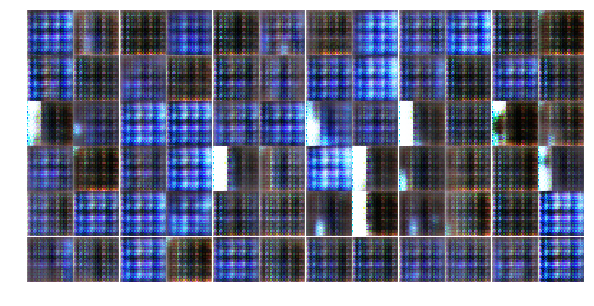

Epoch 2/10... Discriminator Loss: 0.4239... Generator Loss: 1.7702
Epoch 2/10... Discriminator Loss: 0.2778... Generator Loss: 5.2197
Epoch 2/10... Discriminator Loss: 0.2173... Generator Loss: 4.4957
Epoch 2/10... Discriminator Loss: 0.8637... Generator Loss: 3.9218
Epoch 2/10... Discriminator Loss: 0.5638... Generator Loss: 3.1542
Epoch 2/10... Discriminator Loss: 0.4290... Generator Loss: 2.5336
Epoch 2/10... Discriminator Loss: 0.3302... Generator Loss: 3.2878
Epoch 2/10... Discriminator Loss: 0.0336... Generator Loss: 5.2079
Epoch 2/10... Discriminator Loss: 0.0661... Generator Loss: 3.4410
Epoch 2/10... Discriminator Loss: 0.1049... Generator Loss: 4.2353


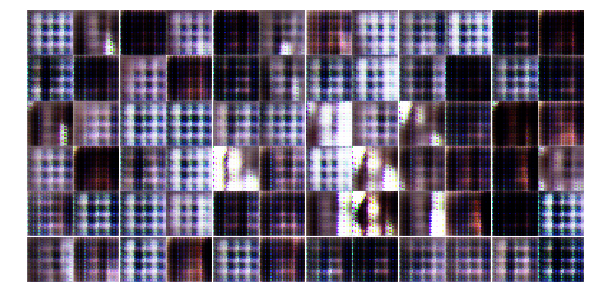

Epoch 2/10... Discriminator Loss: 0.3061... Generator Loss: 2.3703
Epoch 2/10... Discriminator Loss: 0.6200... Generator Loss: 1.2887
Epoch 2/10... Discriminator Loss: 0.3991... Generator Loss: 2.3219
Epoch 2/10... Discriminator Loss: 0.9614... Generator Loss: 1.1744
Epoch 2/10... Discriminator Loss: 0.2838... Generator Loss: 5.4703
Epoch 2/10... Discriminator Loss: 0.4908... Generator Loss: 7.0315
Epoch 2/10... Discriminator Loss: 0.1431... Generator Loss: 3.7680
Epoch 2/10... Discriminator Loss: 0.1894... Generator Loss: 4.5436
Epoch 2/10... Discriminator Loss: 0.8664... Generator Loss: 1.1128
Epoch 2/10... Discriminator Loss: 0.4718... Generator Loss: 2.0627


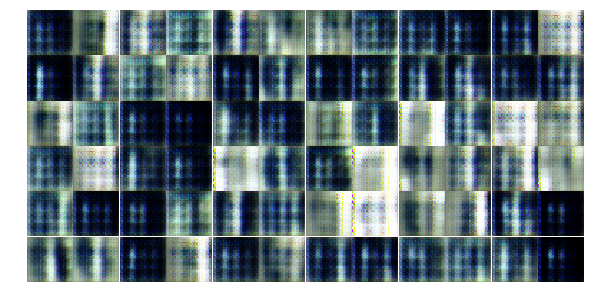

Epoch 2/10... Discriminator Loss: 1.1478... Generator Loss: 1.0452
Epoch 2/10... Discriminator Loss: 0.1893... Generator Loss: 2.5753
Epoch 2/10... Discriminator Loss: 0.1369... Generator Loss: 4.8652
Epoch 2/10... Discriminator Loss: 0.7655... Generator Loss: 5.0428
Epoch 2/10... Discriminator Loss: 0.2449... Generator Loss: 2.6233
Epoch 2/10... Discriminator Loss: 0.4009... Generator Loss: 1.9713
Epoch 2/10... Discriminator Loss: 0.4298... Generator Loss: 1.6073
Epoch 2/10... Discriminator Loss: 0.1582... Generator Loss: 4.0091
Epoch 2/10... Discriminator Loss: 0.2289... Generator Loss: 7.5347
Epoch 2/10... Discriminator Loss: 0.8452... Generator Loss: 2.5686


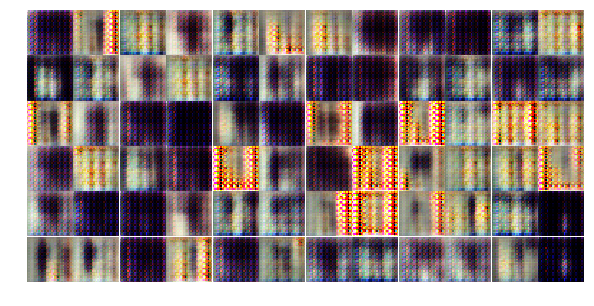

Epoch 2/10... Discriminator Loss: 0.3297... Generator Loss: 2.9932
Epoch 2/10... Discriminator Loss: 0.7213... Generator Loss: 1.4288
Epoch 2/10... Discriminator Loss: 0.3392... Generator Loss: 6.5313
Epoch 2/10... Discriminator Loss: 0.0990... Generator Loss: 3.1505
Epoch 2/10... Discriminator Loss: 0.1299... Generator Loss: 3.1952
Epoch 2/10... Discriminator Loss: 0.0136... Generator Loss: 5.2975
Epoch 2/10... Discriminator Loss: 0.8054... Generator Loss: 1.1736
Epoch 2/10... Discriminator Loss: 0.4110... Generator Loss: 2.4440
Epoch 2/10... Discriminator Loss: 0.6481... Generator Loss: 1.4644
Epoch 2/10... Discriminator Loss: 1.1590... Generator Loss: 1.0788


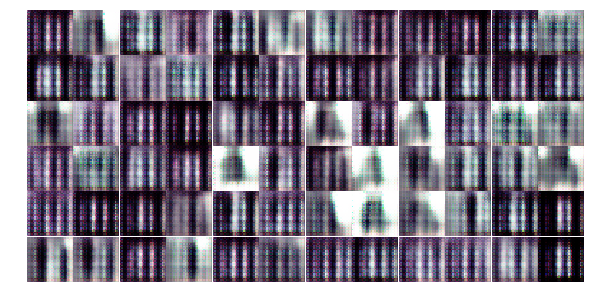

Epoch 2/10... Discriminator Loss: 0.2734... Generator Loss: 2.3610
Epoch 2/10... Discriminator Loss: 0.2016... Generator Loss: 4.4442
Epoch 2/10... Discriminator Loss: 0.3012... Generator Loss: 2.0565
Epoch 2/10... Discriminator Loss: 0.3735... Generator Loss: 1.8809
Epoch 2/10... Discriminator Loss: 0.2086... Generator Loss: 3.4667
Epoch 2/10... Discriminator Loss: 0.0796... Generator Loss: 5.0995
Epoch 2/10... Discriminator Loss: 0.0934... Generator Loss: 3.1848
Epoch 2/10... Discriminator Loss: 0.1113... Generator Loss: 3.5071
Epoch 2/10... Discriminator Loss: 0.1400... Generator Loss: 3.6419
Epoch 2/10... Discriminator Loss: 0.5168... Generator Loss: 1.2104


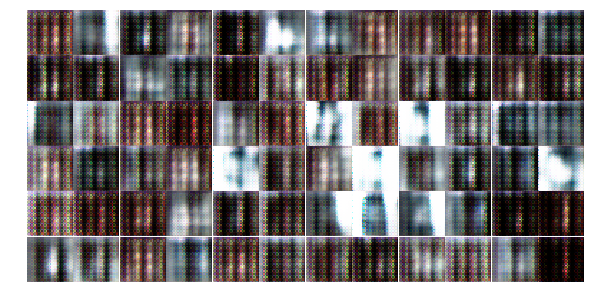

Epoch 2/10... Discriminator Loss: 0.2274... Generator Loss: 3.4526
Epoch 2/10... Discriminator Loss: 0.4106... Generator Loss: 4.3259
Epoch 2/10... Discriminator Loss: 0.6954... Generator Loss: 2.1200
Epoch 2/10... Discriminator Loss: 0.2258... Generator Loss: 3.6282
Epoch 2/10... Discriminator Loss: 0.3965... Generator Loss: 1.3911
Epoch 2/10... Discriminator Loss: 1.0445... Generator Loss: 0.6765
Epoch 2/10... Discriminator Loss: 1.0143... Generator Loss: 1.0114
Epoch 2/10... Discriminator Loss: 0.9088... Generator Loss: 1.0745
Epoch 2/10... Discriminator Loss: 0.5747... Generator Loss: 1.6170
Epoch 3/10... Discriminator Loss: 0.3181... Generator Loss: 2.5788


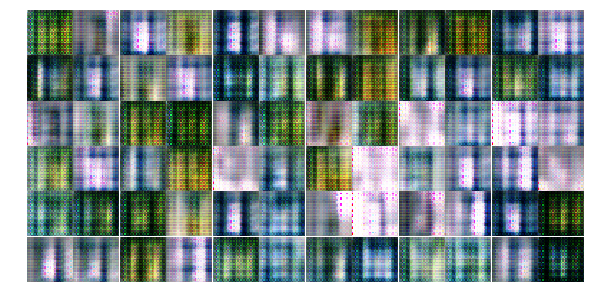

Epoch 3/10... Discriminator Loss: 0.6238... Generator Loss: 4.5838
Epoch 3/10... Discriminator Loss: 0.2978... Generator Loss: 3.4840
Epoch 3/10... Discriminator Loss: 1.0578... Generator Loss: 2.0931
Epoch 3/10... Discriminator Loss: 0.1868... Generator Loss: 2.4111
Epoch 3/10... Discriminator Loss: 0.7001... Generator Loss: 4.2565
Epoch 3/10... Discriminator Loss: 0.1442... Generator Loss: 2.9903
Epoch 3/10... Discriminator Loss: 0.0909... Generator Loss: 3.4591
Epoch 3/10... Discriminator Loss: 0.1214... Generator Loss: 3.1463
Epoch 3/10... Discriminator Loss: 0.7015... Generator Loss: 1.3036
Epoch 3/10... Discriminator Loss: 0.5200... Generator Loss: 1.5419


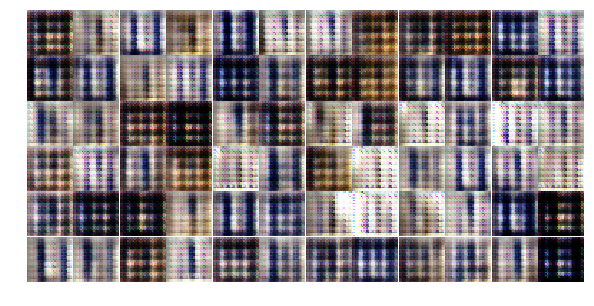

Epoch 3/10... Discriminator Loss: 0.3238... Generator Loss: 1.5629
Epoch 3/10... Discriminator Loss: 0.1029... Generator Loss: 2.9232
Epoch 3/10... Discriminator Loss: 0.4733... Generator Loss: 1.6049
Epoch 3/10... Discriminator Loss: 1.2810... Generator Loss: 6.1991
Epoch 3/10... Discriminator Loss: 0.1703... Generator Loss: 2.6729
Epoch 3/10... Discriminator Loss: 0.1813... Generator Loss: 2.7443
Epoch 3/10... Discriminator Loss: 0.2057... Generator Loss: 2.4090
Epoch 3/10... Discriminator Loss: 0.4040... Generator Loss: 2.1157
Epoch 3/10... Discriminator Loss: 0.4361... Generator Loss: 2.5820
Epoch 3/10... Discriminator Loss: 1.2014... Generator Loss: 0.7997


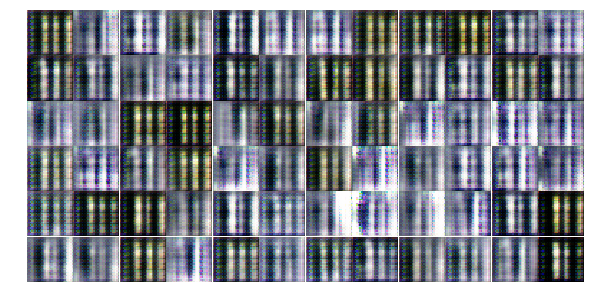

Epoch 3/10... Discriminator Loss: 0.3875... Generator Loss: 2.0373
Epoch 3/10... Discriminator Loss: 1.2528... Generator Loss: 1.6413
Epoch 3/10... Discriminator Loss: 0.2097... Generator Loss: 3.1235
Epoch 3/10... Discriminator Loss: 0.7465... Generator Loss: 2.5333
Epoch 3/10... Discriminator Loss: 0.1314... Generator Loss: 2.7652
Epoch 3/10... Discriminator Loss: 0.1331... Generator Loss: 2.7567
Epoch 3/10... Discriminator Loss: 0.2803... Generator Loss: 3.2320
Epoch 3/10... Discriminator Loss: 0.2015... Generator Loss: 3.1336
Epoch 3/10... Discriminator Loss: 0.3568... Generator Loss: 2.0948
Epoch 3/10... Discriminator Loss: 0.2500... Generator Loss: 2.2946


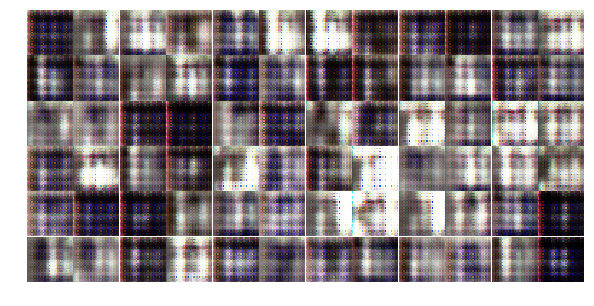

Epoch 3/10... Discriminator Loss: 0.4328... Generator Loss: 1.3887
Epoch 3/10... Discriminator Loss: 0.2805... Generator Loss: 2.2424
Epoch 3/10... Discriminator Loss: 0.0301... Generator Loss: 4.4084
Epoch 3/10... Discriminator Loss: 0.2545... Generator Loss: 1.9366
Epoch 3/10... Discriminator Loss: 0.4500... Generator Loss: 2.0648
Epoch 3/10... Discriminator Loss: 0.9308... Generator Loss: 1.1774
Epoch 3/10... Discriminator Loss: 0.5353... Generator Loss: 2.1359
Epoch 3/10... Discriminator Loss: 0.8749... Generator Loss: 1.3472
Epoch 3/10... Discriminator Loss: 0.3693... Generator Loss: 3.1772
Epoch 3/10... Discriminator Loss: 0.2764... Generator Loss: 2.9896


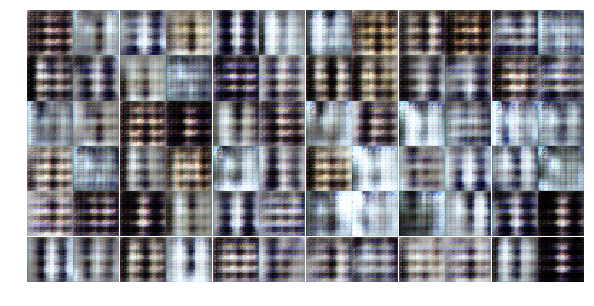

Epoch 3/10... Discriminator Loss: 0.7209... Generator Loss: 1.6523
Epoch 3/10... Discriminator Loss: 0.2784... Generator Loss: 1.8991
Epoch 3/10... Discriminator Loss: 1.1880... Generator Loss: 1.4289
Epoch 3/10... Discriminator Loss: 0.8206... Generator Loss: 3.7460
Epoch 3/10... Discriminator Loss: 0.2916... Generator Loss: 3.8721
Epoch 3/10... Discriminator Loss: 1.4825... Generator Loss: 0.6964
Epoch 3/10... Discriminator Loss: 1.1644... Generator Loss: 3.2197
Epoch 3/10... Discriminator Loss: 2.0478... Generator Loss: 3.1918
Epoch 3/10... Discriminator Loss: 0.3271... Generator Loss: 3.7449
Epoch 3/10... Discriminator Loss: 0.2546... Generator Loss: 2.5343


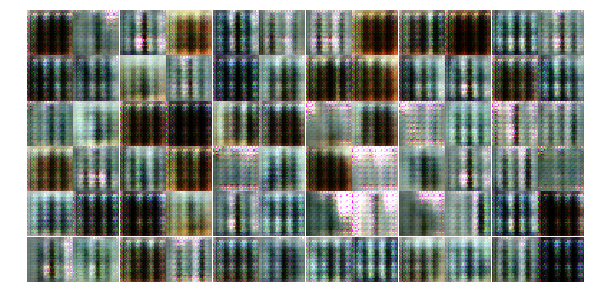

Epoch 3/10... Discriminator Loss: 0.2868... Generator Loss: 3.6889
Epoch 3/10... Discriminator Loss: 0.3699... Generator Loss: 3.8252
Epoch 3/10... Discriminator Loss: 0.1741... Generator Loss: 3.9020
Epoch 3/10... Discriminator Loss: 0.3777... Generator Loss: 2.8735
Epoch 3/10... Discriminator Loss: 0.2421... Generator Loss: 2.6290
Epoch 3/10... Discriminator Loss: 0.2644... Generator Loss: 2.4657
Epoch 3/10... Discriminator Loss: 0.0678... Generator Loss: 4.8895
Epoch 3/10... Discriminator Loss: 0.4623... Generator Loss: 2.3320
Epoch 3/10... Discriminator Loss: 0.2612... Generator Loss: 2.4750
Epoch 3/10... Discriminator Loss: 0.5097... Generator Loss: 6.1128


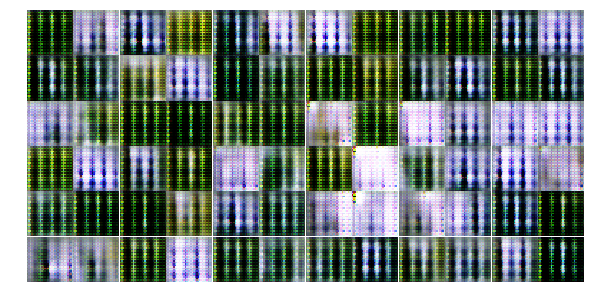

Epoch 3/10... Discriminator Loss: 0.4302... Generator Loss: 2.4050
Epoch 3/10... Discriminator Loss: 0.1417... Generator Loss: 5.0540
Epoch 3/10... Discriminator Loss: 0.7622... Generator Loss: 3.4640
Epoch 3/10... Discriminator Loss: 1.2070... Generator Loss: 1.1943
Epoch 3/10... Discriminator Loss: 0.1246... Generator Loss: 4.4604
Epoch 3/10... Discriminator Loss: 0.0447... Generator Loss: 4.3319
Epoch 3/10... Discriminator Loss: 0.1216... Generator Loss: 3.5393
Epoch 3/10... Discriminator Loss: 0.0439... Generator Loss: 4.1670
Epoch 3/10... Discriminator Loss: 0.0510... Generator Loss: 4.7526
Epoch 3/10... Discriminator Loss: 0.1762... Generator Loss: 2.8685


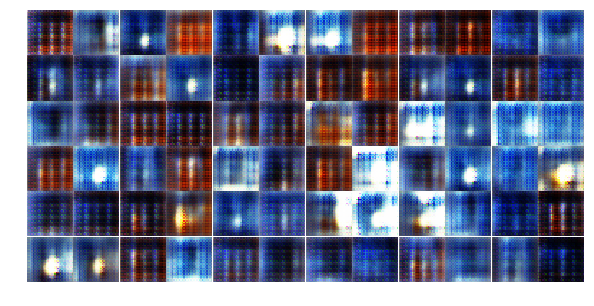

Epoch 3/10... Discriminator Loss: 0.6423... Generator Loss: 5.1065
Epoch 3/10... Discriminator Loss: 0.1355... Generator Loss: 8.1945
Epoch 3/10... Discriminator Loss: 0.0656... Generator Loss: 5.2978
Epoch 3/10... Discriminator Loss: 0.3611... Generator Loss: 4.9973
Epoch 3/10... Discriminator Loss: 0.2542... Generator Loss: 2.0166
Epoch 3/10... Discriminator Loss: 0.8270... Generator Loss: 1.1199
Epoch 3/10... Discriminator Loss: 1.3473... Generator Loss: 0.6192
Epoch 3/10... Discriminator Loss: 0.5722... Generator Loss: 3.0505
Epoch 3/10... Discriminator Loss: 0.2701... Generator Loss: 2.5144
Epoch 3/10... Discriminator Loss: 0.6071... Generator Loss: 1.9832


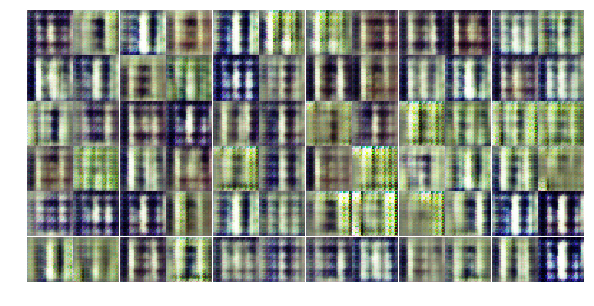

Epoch 3/10... Discriminator Loss: 0.2617... Generator Loss: 2.8749
Epoch 3/10... Discriminator Loss: 0.0580... Generator Loss: 4.7255
Epoch 3/10... Discriminator Loss: 0.4045... Generator Loss: 2.4130
Epoch 3/10... Discriminator Loss: 0.7290... Generator Loss: 1.2449
Epoch 3/10... Discriminator Loss: 0.7146... Generator Loss: 1.8396
Epoch 3/10... Discriminator Loss: 0.7636... Generator Loss: 2.0687
Epoch 3/10... Discriminator Loss: 0.1960... Generator Loss: 2.6720
Epoch 3/10... Discriminator Loss: 0.6377... Generator Loss: 2.4513
Epoch 3/10... Discriminator Loss: 1.7686... Generator Loss: 0.8127
Epoch 3/10... Discriminator Loss: 0.8387... Generator Loss: 1.4974


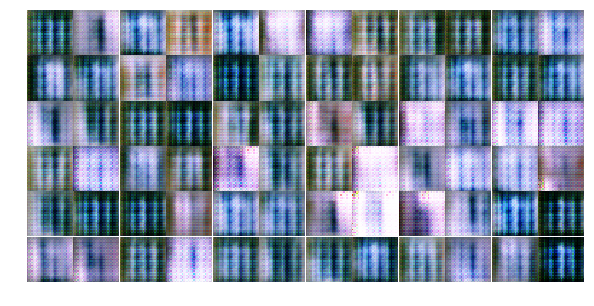

Epoch 3/10... Discriminator Loss: 0.6185... Generator Loss: 2.5277
Epoch 3/10... Discriminator Loss: 0.0584... Generator Loss: 4.7819
Epoch 3/10... Discriminator Loss: 0.1379... Generator Loss: 3.5246
Epoch 3/10... Discriminator Loss: 0.3542... Generator Loss: 3.5080
Epoch 3/10... Discriminator Loss: 0.3367... Generator Loss: 2.0582
Epoch 3/10... Discriminator Loss: 1.3304... Generator Loss: 0.6905
Epoch 3/10... Discriminator Loss: 0.1798... Generator Loss: 6.8282
Epoch 3/10... Discriminator Loss: 0.9159... Generator Loss: 3.0696
Epoch 3/10... Discriminator Loss: 1.4818... Generator Loss: 1.7478
Epoch 3/10... Discriminator Loss: 1.0752... Generator Loss: 1.6104


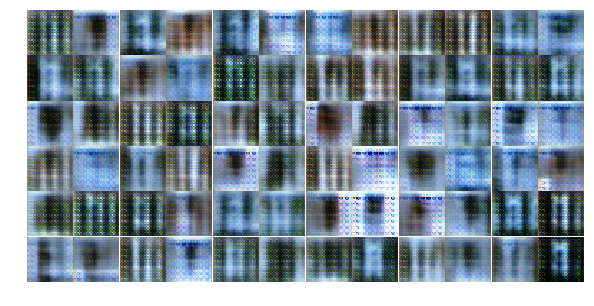

Epoch 3/10... Discriminator Loss: 0.1043... Generator Loss: 4.3410
Epoch 3/10... Discriminator Loss: 0.6701... Generator Loss: 1.8139
Epoch 3/10... Discriminator Loss: 0.6289... Generator Loss: 2.4836
Epoch 3/10... Discriminator Loss: 0.5324... Generator Loss: 3.4892
Epoch 3/10... Discriminator Loss: 0.1821... Generator Loss: 3.7376
Epoch 3/10... Discriminator Loss: 0.1511... Generator Loss: 3.5558
Epoch 3/10... Discriminator Loss: 0.0715... Generator Loss: 3.2636
Epoch 3/10... Discriminator Loss: 0.0417... Generator Loss: 4.9182
Epoch 3/10... Discriminator Loss: 0.0677... Generator Loss: 3.7736
Epoch 3/10... Discriminator Loss: 0.0207... Generator Loss: 6.1283


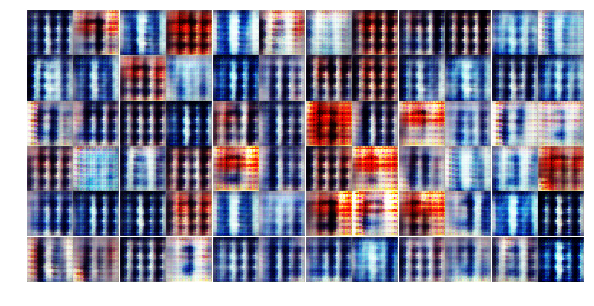

Epoch 3/10... Discriminator Loss: 0.5242... Generator Loss: 3.8653
Epoch 3/10... Discriminator Loss: 0.0501... Generator Loss: 4.3135
Epoch 3/10... Discriminator Loss: 0.4982... Generator Loss: 1.4528
Epoch 4/10... Discriminator Loss: 0.4559... Generator Loss: 3.1211
Epoch 4/10... Discriminator Loss: 0.6492... Generator Loss: 2.6725
Epoch 4/10... Discriminator Loss: 0.2338... Generator Loss: 3.0055
Epoch 4/10... Discriminator Loss: 0.5232... Generator Loss: 1.5390
Epoch 4/10... Discriminator Loss: 0.5231... Generator Loss: 3.4020
Epoch 4/10... Discriminator Loss: 0.9376... Generator Loss: 3.3145
Epoch 4/10... Discriminator Loss: 1.0150... Generator Loss: 2.9357


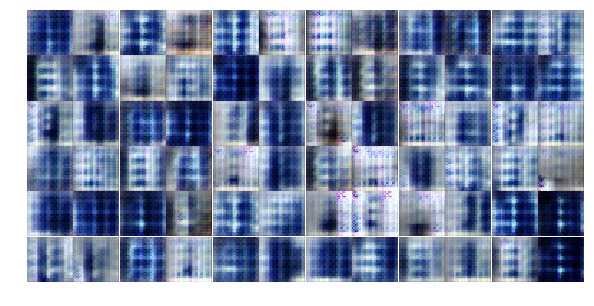

Epoch 4/10... Discriminator Loss: 0.6594... Generator Loss: 3.9425
Epoch 4/10... Discriminator Loss: 0.2769... Generator Loss: 3.7092
Epoch 4/10... Discriminator Loss: 0.1299... Generator Loss: 3.4538
Epoch 4/10... Discriminator Loss: 0.3006... Generator Loss: 2.4043
Epoch 4/10... Discriminator Loss: 0.0967... Generator Loss: 3.7483
Epoch 4/10... Discriminator Loss: 0.1756... Generator Loss: 3.9171
Epoch 4/10... Discriminator Loss: 0.4095... Generator Loss: 6.1055
Epoch 4/10... Discriminator Loss: 0.2514... Generator Loss: 8.0774
Epoch 4/10... Discriminator Loss: 0.5192... Generator Loss: 5.0792
Epoch 4/10... Discriminator Loss: 0.4037... Generator Loss: 3.0490


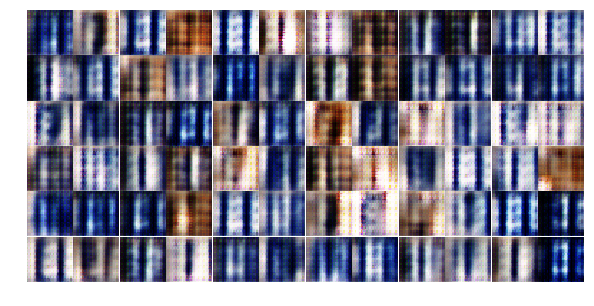

Epoch 4/10... Discriminator Loss: 1.0813... Generator Loss: 5.6143
Epoch 4/10... Discriminator Loss: 0.2088... Generator Loss: 4.3476
Epoch 4/10... Discriminator Loss: 0.1723... Generator Loss: 3.1686
Epoch 4/10... Discriminator Loss: 0.4133... Generator Loss: 1.9568
Epoch 4/10... Discriminator Loss: 1.0880... Generator Loss: 0.7197
Epoch 4/10... Discriminator Loss: 0.7387... Generator Loss: 1.6801
Epoch 4/10... Discriminator Loss: 0.5170... Generator Loss: 2.0988
Epoch 4/10... Discriminator Loss: 0.6278... Generator Loss: 2.6797
Epoch 4/10... Discriminator Loss: 0.2572... Generator Loss: 2.6015
Epoch 4/10... Discriminator Loss: 0.5598... Generator Loss: 2.0882


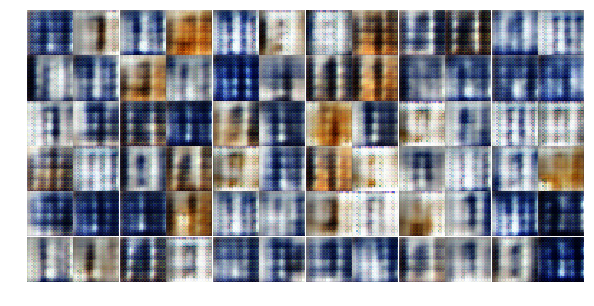

Epoch 4/10... Discriminator Loss: 0.3850... Generator Loss: 2.3943
Epoch 4/10... Discriminator Loss: 0.2556... Generator Loss: 2.7008
Epoch 4/10... Discriminator Loss: 0.3559... Generator Loss: 1.9461
Epoch 4/10... Discriminator Loss: 0.4117... Generator Loss: 3.4125
Epoch 4/10... Discriminator Loss: 0.2832... Generator Loss: 3.3538
Epoch 4/10... Discriminator Loss: 0.2551... Generator Loss: 6.0639
Epoch 4/10... Discriminator Loss: 0.6434... Generator Loss: 2.5027
Epoch 4/10... Discriminator Loss: 0.1945... Generator Loss: 3.2859
Epoch 4/10... Discriminator Loss: 0.1851... Generator Loss: 4.8822
Epoch 4/10... Discriminator Loss: 0.2373... Generator Loss: 2.8084


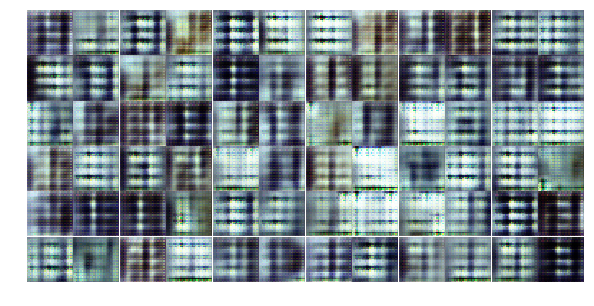

Epoch 4/10... Discriminator Loss: 0.3402... Generator Loss: 2.3105
Epoch 4/10... Discriminator Loss: 0.5010... Generator Loss: 1.6978
Epoch 4/10... Discriminator Loss: 0.1349... Generator Loss: 3.6355
Epoch 4/10... Discriminator Loss: 0.1043... Generator Loss: 4.2433
Epoch 4/10... Discriminator Loss: 0.4035... Generator Loss: 1.7082
Epoch 4/10... Discriminator Loss: 0.2492... Generator Loss: 1.9429
Epoch 4/10... Discriminator Loss: 0.4389... Generator Loss: 3.2888
Epoch 4/10... Discriminator Loss: 0.3810... Generator Loss: 2.5659
Epoch 4/10... Discriminator Loss: 0.1036... Generator Loss: 3.2411
Epoch 4/10... Discriminator Loss: 0.4641... Generator Loss: 1.8205


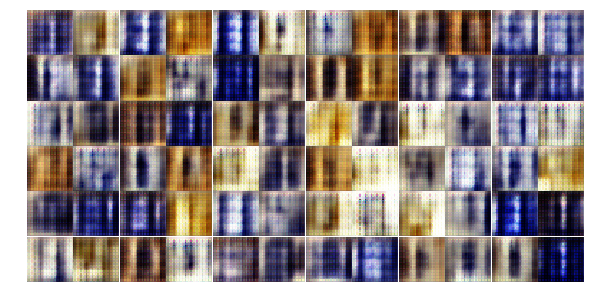

Epoch 4/10... Discriminator Loss: 0.8810... Generator Loss: 1.7589
Epoch 4/10... Discriminator Loss: 0.9849... Generator Loss: 1.3796
Epoch 4/10... Discriminator Loss: 0.1075... Generator Loss: 3.4295
Epoch 4/10... Discriminator Loss: 0.4814... Generator Loss: 1.7852
Epoch 4/10... Discriminator Loss: 0.0895... Generator Loss: 3.3077
Epoch 4/10... Discriminator Loss: 0.2645... Generator Loss: 2.3688
Epoch 4/10... Discriminator Loss: 0.5068... Generator Loss: 2.0447
Epoch 4/10... Discriminator Loss: 0.5427... Generator Loss: 2.9465
Epoch 4/10... Discriminator Loss: 0.1418... Generator Loss: 4.3764
Epoch 4/10... Discriminator Loss: 0.0883... Generator Loss: 3.2026


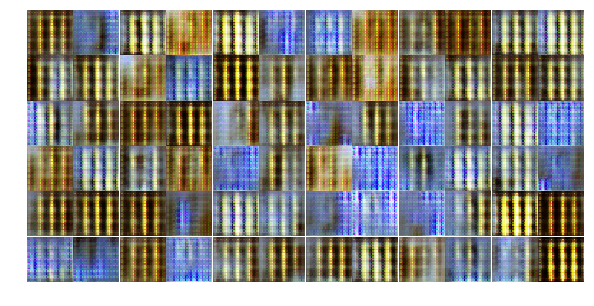

Epoch 4/10... Discriminator Loss: 0.3880... Generator Loss: 3.0320
Epoch 4/10... Discriminator Loss: 0.0911... Generator Loss: 3.8939
Epoch 4/10... Discriminator Loss: 0.2686... Generator Loss: 2.1436
Epoch 4/10... Discriminator Loss: 0.4484... Generator Loss: 1.5512
Epoch 4/10... Discriminator Loss: 0.4705... Generator Loss: 1.4820
Epoch 4/10... Discriminator Loss: 0.6001... Generator Loss: 1.3201
Epoch 4/10... Discriminator Loss: 1.5554... Generator Loss: 0.5566
Epoch 4/10... Discriminator Loss: 0.1408... Generator Loss: 3.5874
Epoch 4/10... Discriminator Loss: 0.3360... Generator Loss: 3.5330
Epoch 4/10... Discriminator Loss: 0.3068... Generator Loss: 2.3190


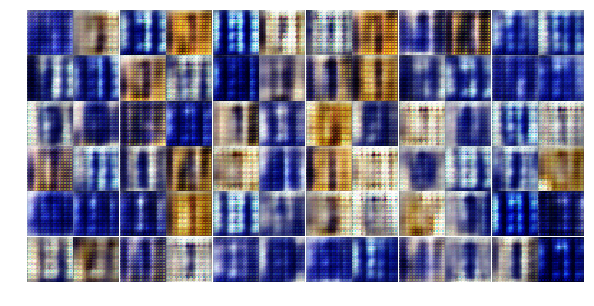

Epoch 4/10... Discriminator Loss: 0.1984... Generator Loss: 2.2737
Epoch 4/10... Discriminator Loss: 0.5270... Generator Loss: 3.6875
Epoch 4/10... Discriminator Loss: 0.0871... Generator Loss: 6.3100
Epoch 4/10... Discriminator Loss: 0.2905... Generator Loss: 3.1977
Epoch 4/10... Discriminator Loss: 1.2102... Generator Loss: 3.5568
Epoch 4/10... Discriminator Loss: 0.0979... Generator Loss: 5.6100
Epoch 4/10... Discriminator Loss: 0.4789... Generator Loss: 3.1530
Epoch 4/10... Discriminator Loss: 0.1716... Generator Loss: 3.6241
Epoch 4/10... Discriminator Loss: 0.3771... Generator Loss: 1.6919
Epoch 4/10... Discriminator Loss: 0.5535... Generator Loss: 1.6017


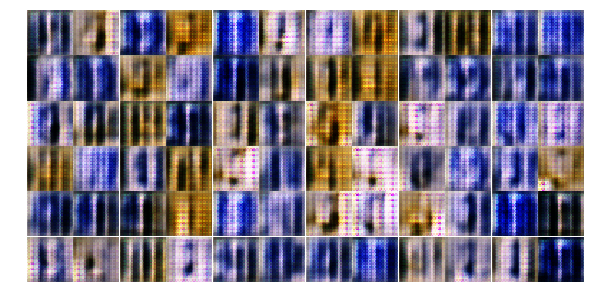

Epoch 4/10... Discriminator Loss: 0.2142... Generator Loss: 3.7778
Epoch 4/10... Discriminator Loss: 0.2666... Generator Loss: 3.1408
Epoch 4/10... Discriminator Loss: 0.4064... Generator Loss: 2.9266
Epoch 4/10... Discriminator Loss: 1.1614... Generator Loss: 3.7374
Epoch 4/10... Discriminator Loss: 0.4654... Generator Loss: 6.8322
Epoch 4/10... Discriminator Loss: 0.1845... Generator Loss: 4.2182
Epoch 4/10... Discriminator Loss: 0.3603... Generator Loss: 1.8509
Epoch 4/10... Discriminator Loss: 0.2008... Generator Loss: 2.8398
Epoch 4/10... Discriminator Loss: 0.6039... Generator Loss: 1.5944
Epoch 4/10... Discriminator Loss: 0.3405... Generator Loss: 4.7533


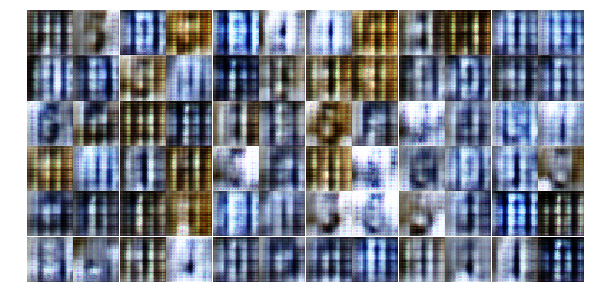

Epoch 4/10... Discriminator Loss: 0.7368... Generator Loss: 2.7008
Epoch 4/10... Discriminator Loss: 0.1216... Generator Loss: 6.9270
Epoch 4/10... Discriminator Loss: 0.2877... Generator Loss: 3.7025
Epoch 4/10... Discriminator Loss: 1.8300... Generator Loss: 2.1372
Epoch 4/10... Discriminator Loss: 0.4447... Generator Loss: 5.0681
Epoch 4/10... Discriminator Loss: 0.5643... Generator Loss: 3.7435
Epoch 4/10... Discriminator Loss: 0.4142... Generator Loss: 2.5134
Epoch 4/10... Discriminator Loss: 0.7520... Generator Loss: 1.9619
Epoch 4/10... Discriminator Loss: 0.1027... Generator Loss: 4.2615
Epoch 4/10... Discriminator Loss: 0.4100... Generator Loss: 1.7344


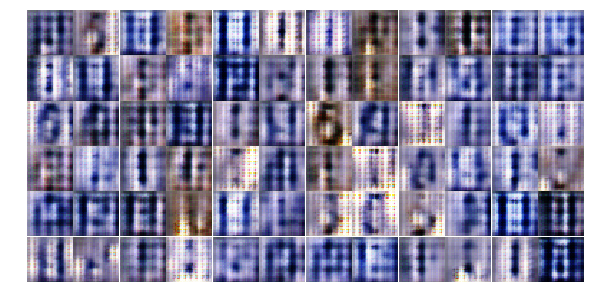

Epoch 4/10... Discriminator Loss: 0.4629... Generator Loss: 1.8418
Epoch 4/10... Discriminator Loss: 0.2246... Generator Loss: 2.1799
Epoch 4/10... Discriminator Loss: 0.0829... Generator Loss: 4.2473
Epoch 4/10... Discriminator Loss: 0.1337... Generator Loss: 3.5301
Epoch 4/10... Discriminator Loss: 0.2190... Generator Loss: 2.3826
Epoch 4/10... Discriminator Loss: 0.3781... Generator Loss: 2.4676
Epoch 4/10... Discriminator Loss: 1.9254... Generator Loss: 1.0496
Epoch 4/10... Discriminator Loss: 0.6441... Generator Loss: 1.9321
Epoch 4/10... Discriminator Loss: 0.4781... Generator Loss: 2.3678
Epoch 4/10... Discriminator Loss: 0.5197... Generator Loss: 3.8252


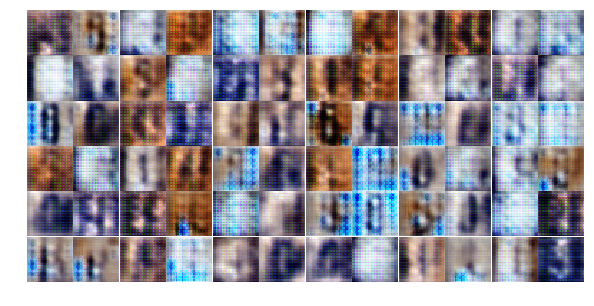

Epoch 4/10... Discriminator Loss: 0.4138... Generator Loss: 2.1495
Epoch 4/10... Discriminator Loss: 0.5826... Generator Loss: 1.9430
Epoch 4/10... Discriminator Loss: 0.1292... Generator Loss: 2.8791
Epoch 4/10... Discriminator Loss: 0.0658... Generator Loss: 4.5125
Epoch 4/10... Discriminator Loss: 0.1267... Generator Loss: 3.5835
Epoch 4/10... Discriminator Loss: 1.5049... Generator Loss: 0.7575
Epoch 4/10... Discriminator Loss: 0.1909... Generator Loss: 3.0119
Epoch 4/10... Discriminator Loss: 1.5711... Generator Loss: 0.6095
Epoch 5/10... Discriminator Loss: 0.3878... Generator Loss: 2.1378
Epoch 5/10... Discriminator Loss: 0.3902... Generator Loss: 2.4892


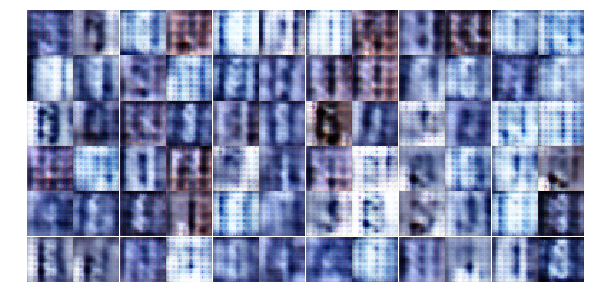

Epoch 5/10... Discriminator Loss: 0.5295... Generator Loss: 3.2420
Epoch 5/10... Discriminator Loss: 0.2400... Generator Loss: 2.5547
Epoch 5/10... Discriminator Loss: 1.0734... Generator Loss: 1.6053
Epoch 5/10... Discriminator Loss: 0.2737... Generator Loss: 5.0823
Epoch 5/10... Discriminator Loss: 0.6416... Generator Loss: 2.2652
Epoch 5/10... Discriminator Loss: 0.7152... Generator Loss: 1.5656
Epoch 5/10... Discriminator Loss: 0.3045... Generator Loss: 2.8419
Epoch 5/10... Discriminator Loss: 0.5884... Generator Loss: 3.0236
Epoch 5/10... Discriminator Loss: 0.7964... Generator Loss: 3.7136


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

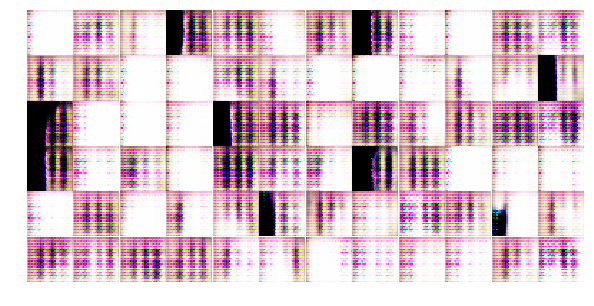

In [91]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))